# Kaggle Dogs vs. Cats Solution with ResNet50

Classified datasets as dog and cat with ResNet50 model, and drew Confusion Matrix and Grad-CAM for evaluation. The codes below were executed in Google Colab, thus manipulation should be done when running on other environments.

---
Implemented the ResNet50 model from keras-application for image classification

https://github.com/keras-team/keras-applications/blob/master/keras_applications/resnet50.py

The datasets are from kaggle competition

https://www.kaggle.com/c/dogs-vs-cats/data

In [0]:
# keras-vis released on pip is 0.4.1 which has conflicts on drawing Grad-CAM
# install it directly from the master branch
!pip install git+https://github.com/raghakot/keras-vis.git -U

  Cloning https://github.com/raghakot/keras-vis.git to /tmp/pip-req-build-jv5hc89d
  Stored in directory: /tmp/pip-ephem-wheel-cache-fy6d4eqs/wheels/c5/ae/e7/b34d1cb48b1898f606a5cce08ebc9521fa0588f37f1e590d9f
Successfully built keras-vis
  Found existing installation: keras-vis 0.4.1
    Uninstalling keras-vis-0.4.1:
      Successfully uninstalled keras-vis-0.4.1


In [0]:
# mount to your google drive
from google.colab import drive
drive.mount('/gdrive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /gdrive


In [0]:
# import the necessary libraries
import os, cv2, re, random
import numpy as np
import pandas as pd
from keras.callbacks import ModelCheckpoint
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import img_to_array, load_img
from keras import Input, layers, models, optimizers, activations
from keras.layers import Dense, Activation, Conv2D, MaxPooling2D, Flatten, Dropout, ZeroPadding2D, BatchNormalization
from keras.models import Sequential, load_model
from keras import backend as K
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.cm as cm
from vis.visualization import visualize_saliency, overlay, visualize_cam
from vis.utils import utils

Using TensorFlow backend.


In [0]:
# create helper functions to sort the image files with numeric values in each file name
def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    return [ atoi(c) for c in re.split('(\d+)', text) ]

# in order for images to be represented in numbers use the openCV library to read and resize each image
# generate labels of each image
def prepare_data(list_of_img):
    
    x = []
    y = []
    
    for image in list_of_img:
        x.append(cv2.resize(cv2.imread(image), (224,224), interpolation=cv2.INTER_CUBIC))
        
    for i in list_of_img:
        if 'dog' in i:
            y.append(1)
        elif 'cat' in i:
            y.append(0)
    
    return x, y

In [0]:
# path of the image files
img_dir = '/gdrive/My Drive/Colab Notebooks/Kaggle_Cat_VS_Dog/data_images/'
img = [img_dir + i for i in os.listdir(img_dir)]

img.sort(key=natural_keys)
print('withdrew {:d} images from the drive'.format(len(img)))

# 8000 images for training data
train_img_cat = img[1:4001]
train_img_dog = img[12501:16501]

# 600 images for testing data
test_img = img[4001:4301]
test_img += img[16501:16801]

withdrew 25000 images from the drive


In [0]:
# generate x and y
x_cat, y_cat = prepare_data(train_img_cat)
x_dog, y_dog = prepare_data(train_img_dog)

# split the dataset into 2 parts, training set and validation set
x_train_cat, x_val_cat, y_train_cat, y_val_cat = train_test_split(x_cat, y_cat, test_size = 0.2, random_state = 1)
x_train_dog, x_val_dog, y_train_dog, y_val_dog = train_test_split(x_dog, y_dog, test_size = 0.2, random_state = 1)

x_train = x_train_cat + x_train_dog
y_train = y_train_cat + y_train_dog
print('train set ready\n\n')

x_val = x_val_cat + x_val_dog
y_val = y_val_cat + y_val_dog
print('validation set ready\n\n')

# generate x_test and y_test
x_test, y_test = prepare_data(test_img)
print('test set ready\n\n')
print(K.image_data_format())

train set ready


validation set ready


test set ready


channels_last


In [0]:
batch_size = 16

nb_train_samples = len(x_train)
nb_validation_samples = len(x_val)
nb_test_samples = len(x_test)

In [0]:
# augmentation is used for the training set and validation set
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   width_shift_range=0.1,
                                   height_shift_range=0.1,
                                   rotation_range=10,
                                   zoom_range=0.1,)

val_datagen = ImageDataGenerator(rescale=1./255, 
                                 width_shift_range=0.1,
                                 height_shift_range=0.1,
                                 rotation_range=10,
                                 zoom_range=0.1,)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow(np.array(x_train), np.array(y_train), batch_size = batch_size)
validation_generator = val_datagen.flow(np.array(x_val), np.array(y_val), batch_size = batch_size)
test_generator = test_datagen.flow(np.array(x_test), np.array(y_test), batch_size=1)

In [0]:
# functions to create ResNet50 model
def identity_block(input_tensor, kernel_size, filters, stage, block):
    """The identity block is the block that has no conv layer at shortcut.
    # Arguments
        input_tensor: input tensor
        kernel_size: default 3, the kernel size of
            middle conv layer at main path
        filters: list of integers, the filters of 3 conv layer at main path
        stage: integer, current stage label, used for generating layer names
        block: 'a','b'..., current block label, used for generating layer names
    # Returns
        Output tensor for the block.
    """
    filters1, filters2, filters3 = filters
    
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = layers.Conv2D(filters1, (1, 1),
                      kernel_initializer='he_normal',
                      name=conv_name_base + '2a')(input_tensor)
    x = layers.BatchNormalization(axis=3, name=bn_name_base + '2a')(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv2D(filters2, kernel_size,
                      padding='same',
                      kernel_initializer='he_normal',
                      name=conv_name_base + '2b')(x)
    x = layers.BatchNormalization(axis=3, name=bn_name_base + '2b')(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv2D(filters3, (1, 1),
                      kernel_initializer='he_normal',
                      name=conv_name_base + '2c')(x)
    x = layers.BatchNormalization(axis=3, name=bn_name_base + '2c')(x)

    x = layers.add([x, input_tensor])
    x = layers.Activation('relu')(x)
    return x

def conv_block(input_tensor,
               kernel_size,
               filters,
               stage,
               block,
               strides=(2, 2)):
    """A block that has a conv layer at shortcut.
    # Arguments
        input_tensor: input tensor
        kernel_size: default 3, the kernel size of
            middle conv layer at main path
        filters: list of integers, the filters of 3 conv layer at main path
        stage: integer, current stage label, used for generating layer names
        block: 'a','b'..., current block label, used for generating layer names
        strides: Strides for the first conv layer in the block.
    # Returns
        Output tensor for the block.
    Note that from stage 3,
    the first conv layer at main path is with strides=(2, 2)
    And the shortcut should have strides=(2, 2) as well
    """
    filters1, filters2, filters3 = filters
    
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    x = layers.Conv2D(filters1, (1, 1), strides=strides,
                      kernel_initializer='he_normal',
                      name=conv_name_base + '2a')(input_tensor)
    x = layers.BatchNormalization(axis=3, name=bn_name_base + '2a')(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv2D(filters2, kernel_size, padding='same',
                      kernel_initializer='he_normal',
                      name=conv_name_base + '2b')(x)
    x = layers.BatchNormalization(axis=3, name=bn_name_base + '2b')(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv2D(filters3, (1, 1),
                      kernel_initializer='he_normal',
                      name=conv_name_base + '2c')(x)
    x = layers.BatchNormalization(axis=3, name=bn_name_base + '2c')(x)

    shortcut = layers.Conv2D(filters3, (1, 1), strides=strides,
                             kernel_initializer='he_normal',
                             name=conv_name_base + '1')(input_tensor)
    shortcut = layers.BatchNormalization(axis=3, name=bn_name_base + '1')(shortcut)

    x = layers.add([x, shortcut])
    x = layers.Activation('relu')(x)
    return x

def ResNet50(input_shape=(224,224,3), classes=1):
    
    img_input = Input(input_shape)

    x = layers.ZeroPadding2D(padding=(3, 3), name='conv1_pad')(img_input)
    x = layers.Conv2D(64, (7, 7),
                      strides=(2, 2),
                      padding='valid',
                      kernel_initializer='he_normal',
                      name='conv1')(x)
    x = layers.BatchNormalization(axis=3, name='bn_conv1')(x)
    x = layers.Activation('relu')(x)
    x = layers.ZeroPadding2D(padding=(1, 1), name='pool1_pad')(x)
    x = layers.MaxPooling2D((3, 3), strides=(2, 2))(x)

    x = conv_block(x, 3, [64, 64, 256], stage=2, block='a', strides=(1, 1))
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='b')
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='c')

    x = conv_block(x, 3, [128, 128, 512], stage=3, block='a')
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='b')
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='c')
    x = identity_block(x, 3, [128, 128, 512], stage=3, block='d')

    x = conv_block(x, 3, [256, 256, 1024], stage=4, block='a')
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='b')
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='c')
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='d')
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='e')
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block='f')

    x = conv_block(x, 3, [512, 512, 2048], stage=5, block='a')
    x = identity_block(x, 3, [512, 512, 2048], stage=5, block='b')
    x = identity_block(x, 3, [512, 512, 2048], stage=5, block='c')
    
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(classes, activation='sigmoid')(x)
    
    # create model.
    model = models.Model(inputs=img_input, outputs=x, name='ResNet50')

    return model

In [0]:
model = ResNet50(input_shape=(224,224,3), classes=1)
# load the saved weight if you have already trained the model 
model.load_weights('/gdrive/My Drive/Colab Notebooks/Kaggle_Cat_VS_Dog/bestweight_resnet50.h5')
model.compile(loss = 'binary_crossentropy', optimizer=optimizers.adam(lr=0.0001), metrics = ['acc'])
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [0]:
# add checkpoint to save the best weight
filepath='/gdrive/My Drive/Colab Notebooks/Kaggle_Cat_VS_Dog/bestweight_resnet50.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [checkpoint]

In [0]:
history = model.fit_generator(train_generator,
                              steps_per_epoch = nb_train_samples // batch_size,
                              epochs = 60,
                              validation_data = validation_generator,
                              validation_steps = nb_validation_samples // batch_size,
                              callbacks = callbacks_list)

Instructions for updating:
Use tf.cast instead.
Epoch 1/60
400/400 [==============================] - 262s 654ms/step - loss: 0.6779 - acc: 0.6003 - val_loss: 0.7876 - val_acc: 0.5581

Epoch 00001: val_loss improved from inf to 0.78765, saving model to /gdrive/My Drive/Colab Notebooks/Kaggle_Cat_VS_Dog/bestweight.h5
Epoch 2/60
400/400 [==============================] - 241s 602ms/step - loss: 0.6539 - acc: 0.6256 - val_loss: 0.7034 - val_acc: 0.5700

Epoch 00002: val_loss improved from 0.78765 to 0.70340, saving model to /gdrive/My Drive/Colab Notebooks/Kaggle_Cat_VS_Dog/bestweight.h5
Epoch 3/60
400/400 [==============================] - 240s 600ms/step - loss: 0.6324 - acc: 0.6456 - val_loss: 0.7594 - val_acc: 0.6069

Epoch 00003: val_loss did not improve from 0.70340
Epoch 4/60
400/400 [==============================] - 240s 600ms/step - loss: 0.6242 - acc: 0.6586 - val_loss: 0.6566 - val_acc: 0.6481

Epoch 00004: val_loss improved from 0.70340 to 0.65656, saving model to /gdrive/My 

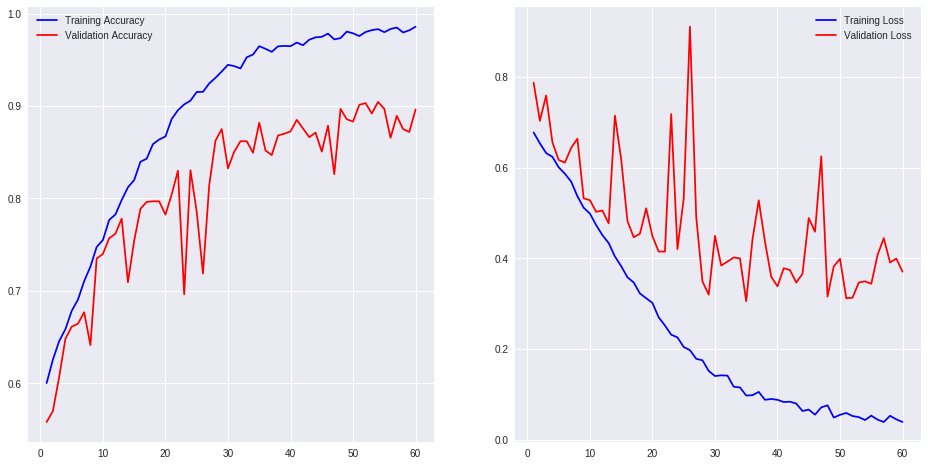

In [0]:
# plot the measure of the accuracy and loss of the model
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epoch = range(1, len(acc) + 1)
f, ax = plt.subplots(1, 2, figsize = (16, 8))
ax[0].plot(epoch, acc, 'b', label = 'Training Accuracy')
ax[0].plot(epoch, val_acc, 'r', label = 'Validation Accuracy')
ax[0].legend()
ax[1].plot(epoch, loss, 'b', label = 'Training Loss')
ax[1].plot(epoch, val_loss, 'r', label = 'Validation Loss')
ax[1].legend()
plt.show()

In [0]:
print('-- Evaluation --\n')

scores = model.evaluate_generator(test_generator, steps = nb_test_samples)

print('%s: %.2f%%\n\n' %(model.metrics_names[1], scores[1]*100))

# print the predicted result of the test images
print('-- Prediction --\n')

output = model.predict_generator(test_generator, steps = nb_test_samples)

np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

print(output)

-- Evaluation --

acc: 89.83%


-- Prediction --

[[0.002]
 [0.101]
 [0.221]
 [0.000]
 [0.000]
 [0.006]
 [0.897]
 [0.572]
 [0.062]
 [0.988]
 [0.997]
 [1.000]
 [0.371]
 [0.019]
 [0.084]
 [0.998]
 [0.998]
 [0.537]
 [0.974]
 [0.000]
 [0.501]
 [0.902]
 [0.000]
 [1.000]
 [0.578]
 [1.000]
 [0.927]
 [0.182]
 [0.013]
 [1.000]
 [0.001]
 [0.974]
 [0.000]
 [0.987]
 [0.003]
 [0.993]
 [0.001]
 [0.995]
 [0.998]
 [0.511]
 [1.000]
 [0.000]
 [1.000]
 [0.999]
 [0.077]
 [0.001]
 [0.070]
 [0.984]
 [0.990]
 [0.011]
 [1.000]
 [0.999]
 [1.000]
 [0.003]
 [0.010]
 [0.982]
 [0.002]
 [0.645]
 [0.000]
 [0.813]
 [1.000]
 [1.000]
 [0.000]
 [0.999]
 [0.013]
 [0.993]
 [0.959]
 [0.006]
 [0.174]
 [0.993]
 [0.999]
 [0.996]
 [0.155]
 [0.936]
 [0.001]
 [0.994]
 [0.031]
 [0.260]
 [1.000]
 [1.000]
 [0.000]
 [1.000]
 [1.000]
 [0.942]
 [0.012]
 [1.000]
 [0.000]
 [0.035]
 [0.301]
 [0.912]
 [0.000]
 [0.001]
 [0.999]
 [0.000]
 [0.253]
 [0.525]
 [0.999]
 [0.002]
 [1.000]
 [1.000]
 [0.988]
 [0.975]
 [0.293]
 [0.995]
 [0.004]
 [0.9

In [0]:
y_test = np.array(y_test)
y_pred = np.take(output, range(len(output)))
y_pred = np.rint(y_pred)
print(y_test)
print(y_pred)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

-- Confusion Matrix --




<Figure size 432x288 with 0 Axes>

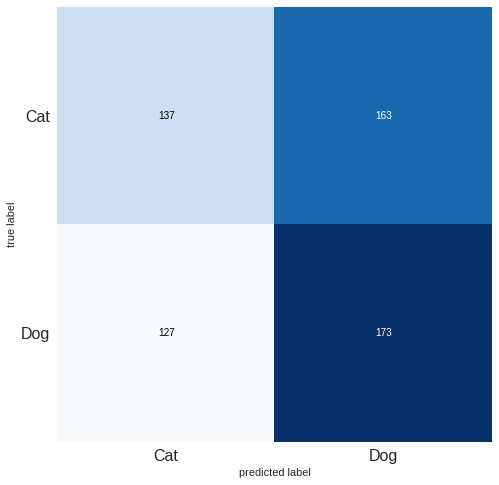

In [0]:
from mlxtend.plotting import plot_confusion_matrix

# print the Confusion Matrix for evaluating the performance of the model
print('-- Confusion Matrix --\n\n')
CM = confusion_matrix(y_test, y_pred)
plt.figure()
plot_confusion_matrix(CM, figsize = (12, 8), hide_ticks = True, cmap = plt.cm.Blues)
plt.xticks(range(2), ['Cat', 'Dog'], fontsize=16)
plt.yticks(range(2), ['Cat', 'Dog'], fontsize=16)
plt.show()

In [0]:
correct_indices = []
incorrect_indices = []

# separate the correctly predicted results with incorrectly predicted ones
for i in range(len(y_pred)):
  if y_pred[i] == y_test[i]:
    correct_indices.append(i)
  else:
    incorrect_indices.append(i)

correct_indices = np.array(correct_indices)
incorrect_indices = np.array(incorrect_indices)

print('-- Correctly Predicted Results\' Indices --\n')
print('{:d} images are correctly predicted\n'.format(len(correct_indices)))
print(correct_indices)

print('\n\n-- Incorrectly Predicted Results\' Indices --\n')
print('{:d} images are incorrectly predicted\n'.format(len(incorrect_indices)))
print(incorrect_indices)

-- Correctly Predicted Results' Indices --

310 images are correctly predicted

[  0   1   2   3   4   5   8  12  13  14  19  22  27  28  30  32  34  36
  41  44  45  46  49  53  54  56  58  62  64  67  68  72  74  76  77  80
  84  86  87  88  90  91  93  94  97 102 104 110 115 116 117 119 120 121
 124 125 126 127 131 132 133 135 136 139 144 149 150 151 152 153 154 156
 157 160 172 179 182 184 186 189 192 193 195 196 203 209 210 211 212 214
 215 218 220 222 224 225 226 227 230 231 232 234 238 239 240 242 243 244
 249 251 253 254 255 256 257 258 259 260 261 264 266 269 270 272 273 275
 276 278 279 281 284 287 290 292 295 296 299 304 305 310 311 313 314 316
 321 323 325 327 328 330 331 332 333 334 336 337 338 340 341 342 343 347
 352 353 354 356 358 361 362 364 366 367 368 369 370 372 375 376 378 381
 382 383 387 389 391 392 393 395 397 400 404 406 407 410 411 413 414 415
 418 420 421 422 423 424 425 429 430 431 432 433 435 436 440 441 442 445
 446 448 450 453 454 456 458 459 460 461 463

-- Grad-CAM of Correct Predictions --

Instructions for updating:
Use tf.cast instead.


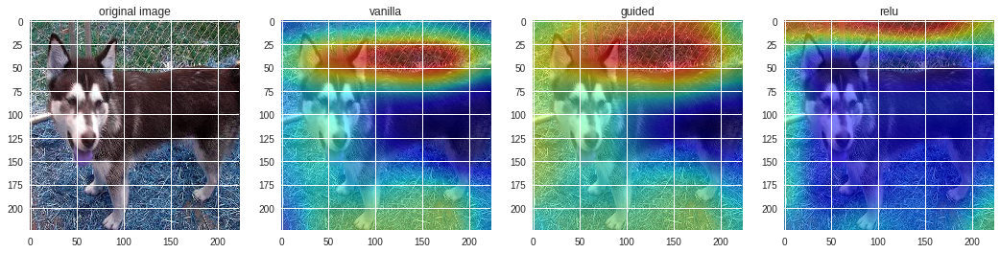

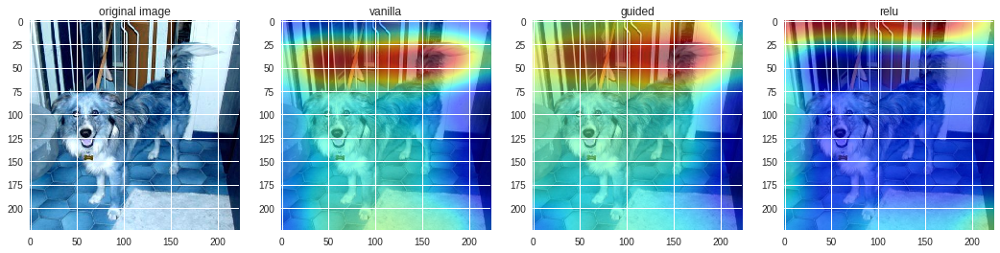

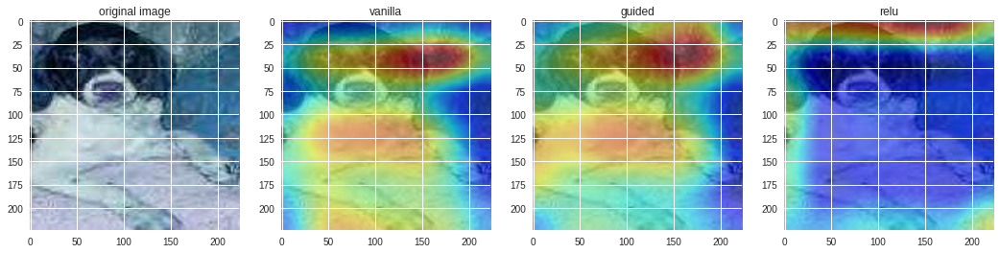

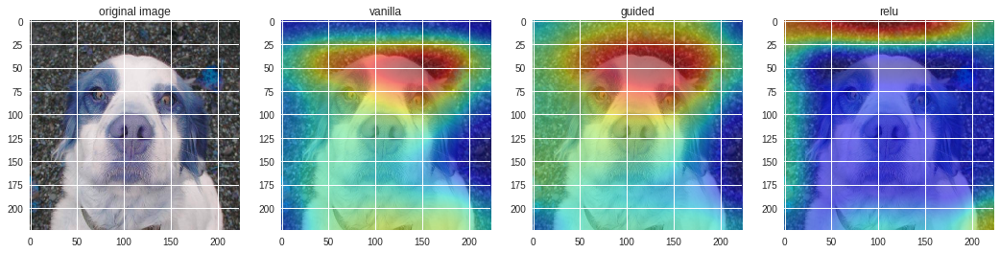

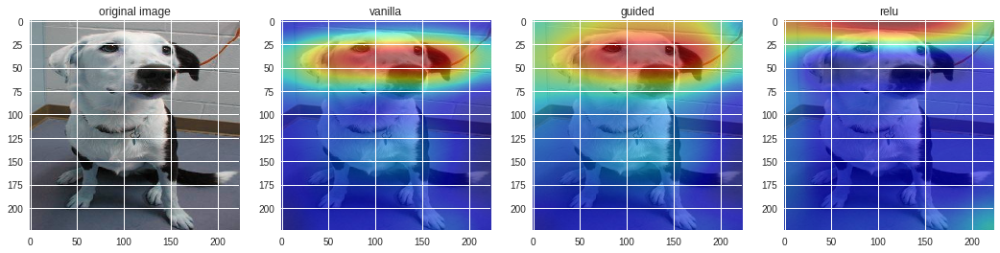

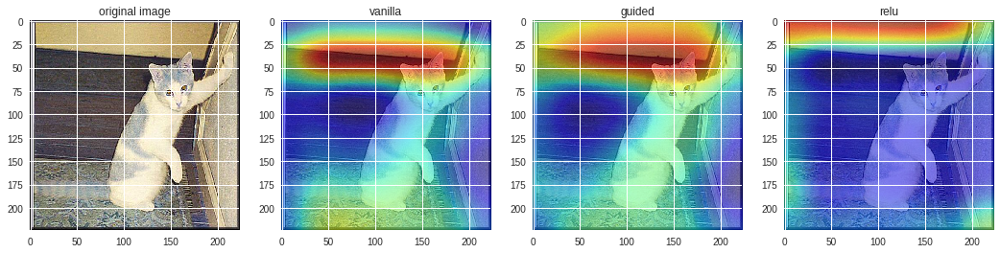

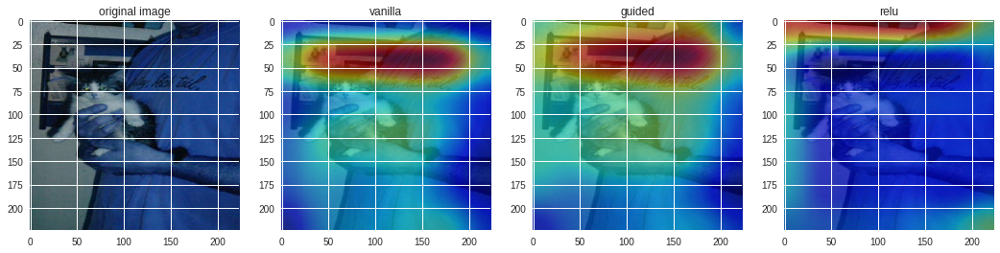

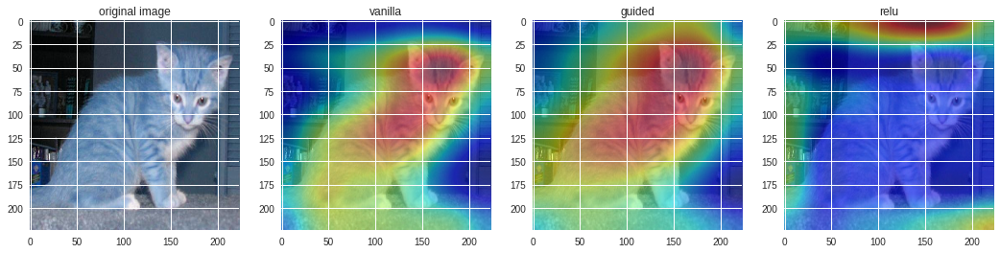

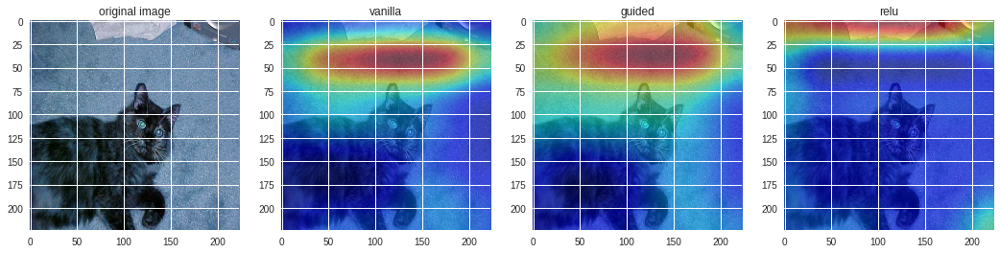

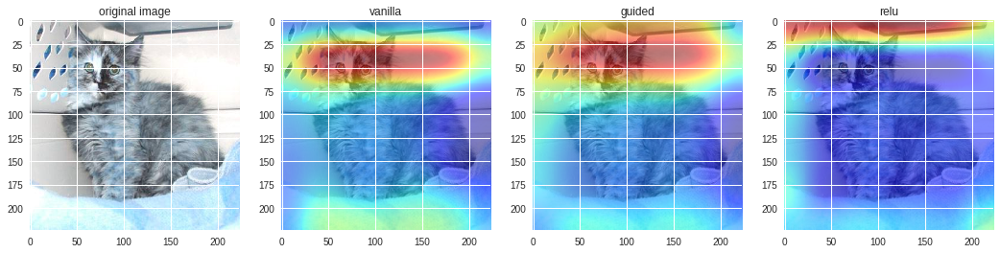

In [0]:
layer_idx = utils.find_layer_idx(model, 'dense_2')
penultimate_layer = utils.find_layer_idx(model, 'res5c_branch2c')
model.layers[layer_idx].activation = activations.linear
model = utils.apply_modifications(model)

print('-- Grad-CAM of Correct Predictions --\n')

plt.rcParams['figure.figsize'] = (18, 6)
for i in range(-5, 5):
  idx = correct_indices[i]
  f, ax = plt.subplots(1, 4)
  ax[0].set_title('original image')
  ax[0].imshow(x_test[idx])
  
  for j, modifier in enumerate([None, 'guided', 'relu']):
    grads = visualize_cam(model, layer_idx, filter_indices = 0, seed_input = x_test[idx], penultimate_layer_idx = penultimate_layer, backprop_modifier = modifier)
    
    if modifier is None:
      modifier = 'vanilla'

    ax[j + 1].set_title(modifier)
    jet_heatmap = np.uint8(cm.jet(grads)[..., :3] * 255)
    ax[j + 1].imshow(overlay(jet_heatmap, x_test[idx]))

-- Grad-CAM of Incorrect Predictions --



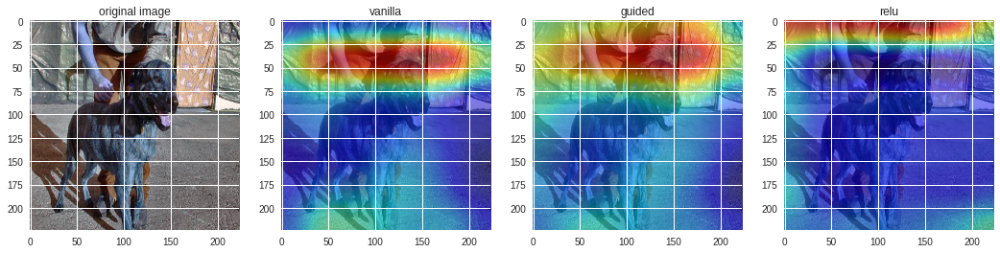

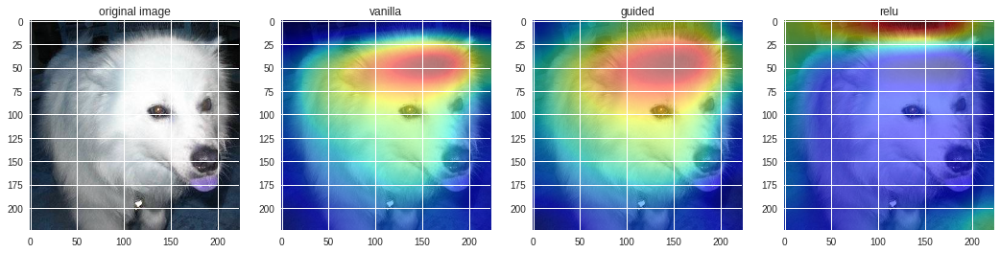

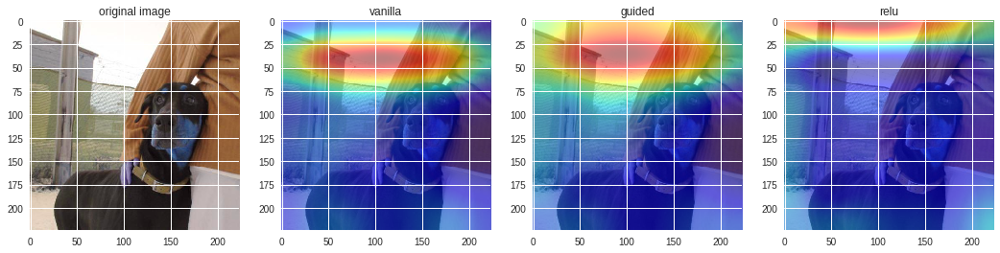

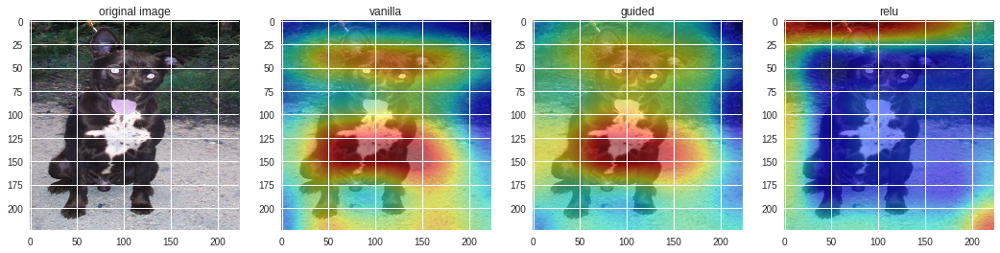

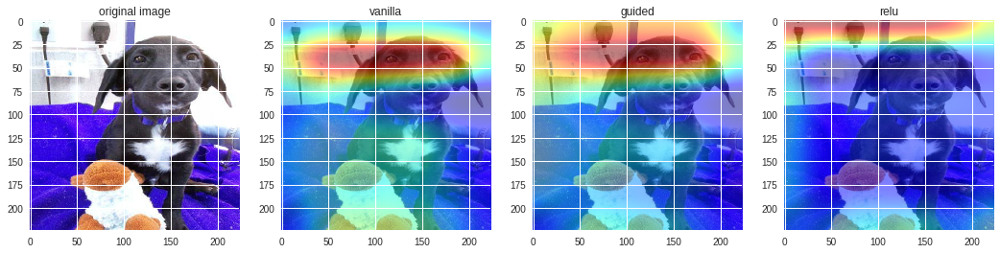

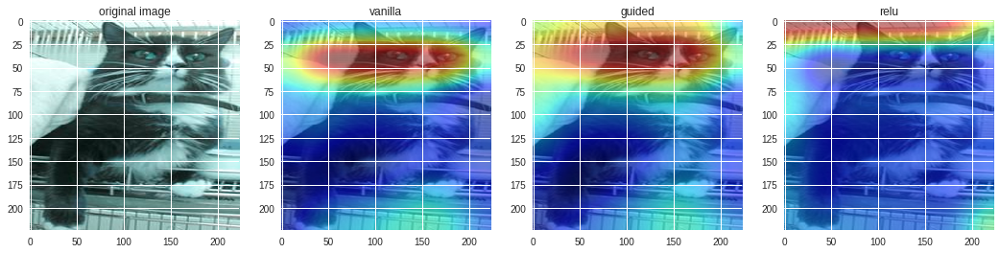

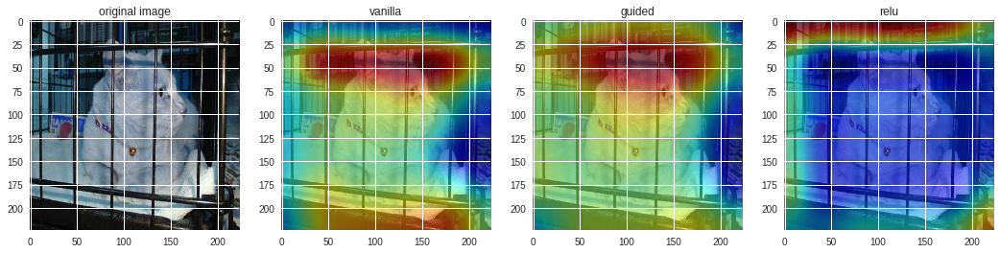

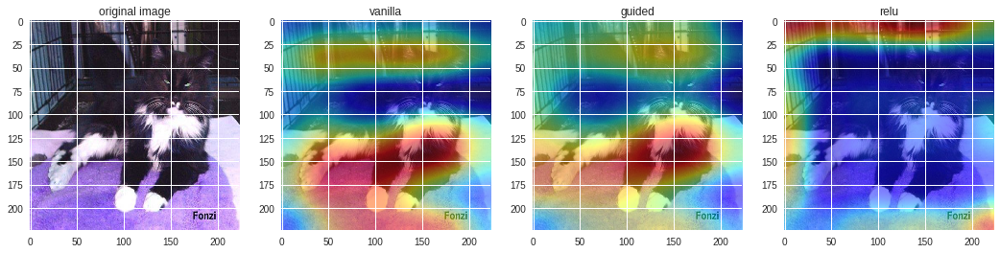

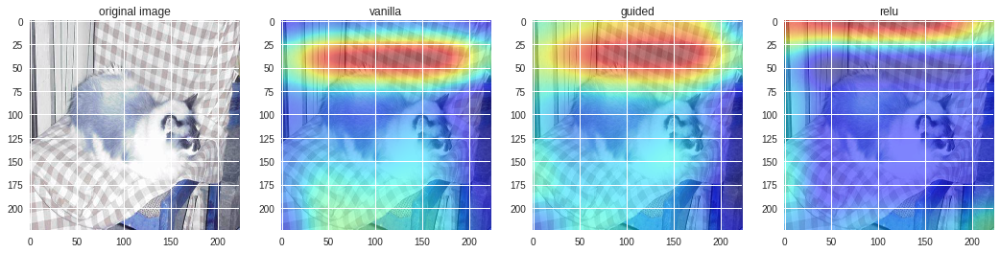

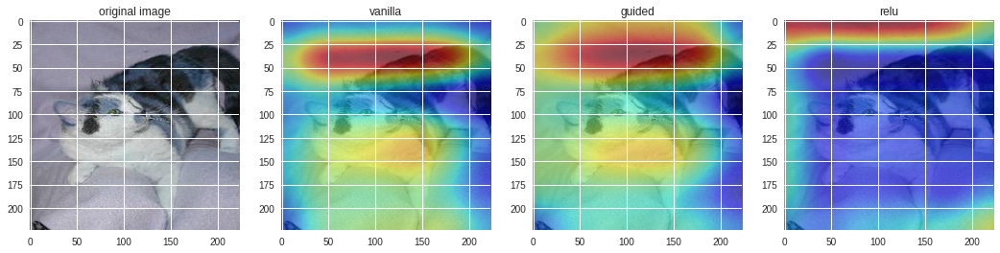

In [0]:
print('-- Grad-CAM of Incorrect Predictions --\n')

plt.rcParams['figure.figsize'] = (18, 6)
for i in range(-5, 5):
  idx = incorrect_indices[i]
  f, ax = plt.subplots(1, 4)
  ax[0].set_title('original image')
  ax[0].imshow(x_test[idx])
  
  for j, modifier in enumerate([None, 'guided', 'relu']):
    grads = visualize_cam(model, layer_idx, filter_indices = 0, seed_input = x_test[idx], penultimate_layer_idx = penultimate_layer, backprop_modifier = modifier)
    
    if modifier is None:
      modifier = 'vanilla'

    ax[j + 1].set_title(modifier)
    jet_heatmap = np.uint8(cm.jet(grads)[..., :3] * 255)
    ax[j + 1].imshow(overlay(jet_heatmap, x_test[idx]))

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


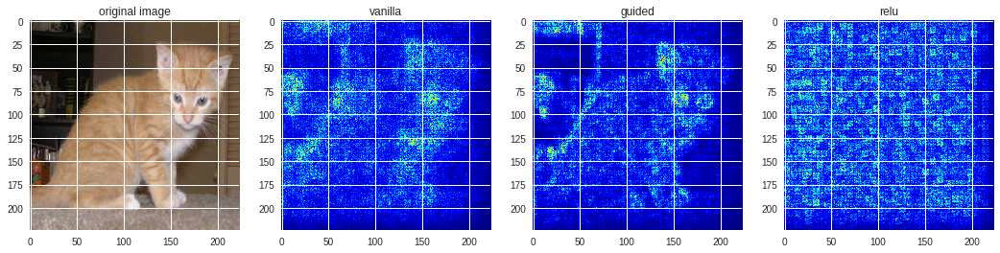

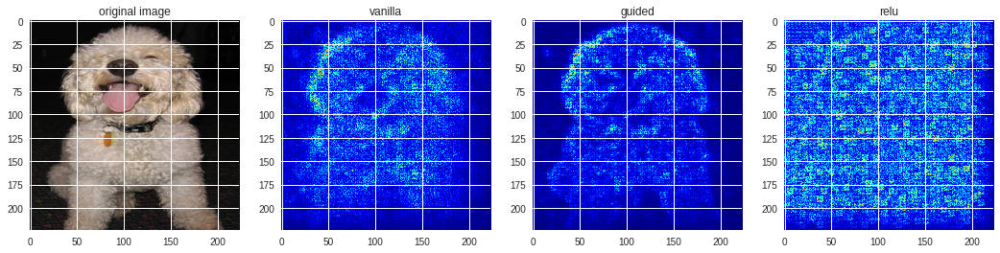

In [0]:
cat_img = utils.load_img('/gdrive/My Drive/Colab Notebooks/Kaggle_Cat_VS_Dog/data_images/cat.4003.jpg', target_size=(224, 224))
dog_img = utils.load_img('/gdrive/My Drive/Colab Notebooks/Kaggle_Cat_VS_Dog/data_images/dog.4003.jpg', target_size=(224, 224))

plt.rcParams['figure.figsize'] = (18, 6)

for i, selected_img in enumerate([cat_img, dog_img]):
  f, ax = plt.subplots(1, 4)
  ax[0].set_title('original image')
  ax[0].imshow(selected_img)
  
  for j, modifier in enumerate([None, 'guided', 'relu']):
    grads = visualize_saliency(model, layer_idx, filter_indices = 0, seed_input = selected_img, backprop_modifier = modifier)
    
    if modifier is None:
      modifier = 'vanilla'
    
    ax[j + 1].set_title(modifier)
    ax[j + 1].imshow(grads, cmap='jet')    

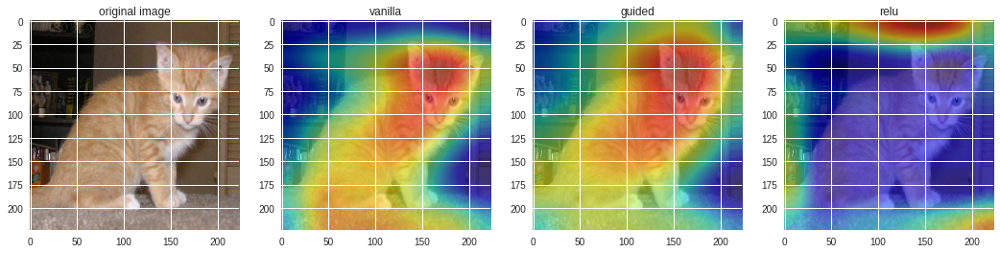

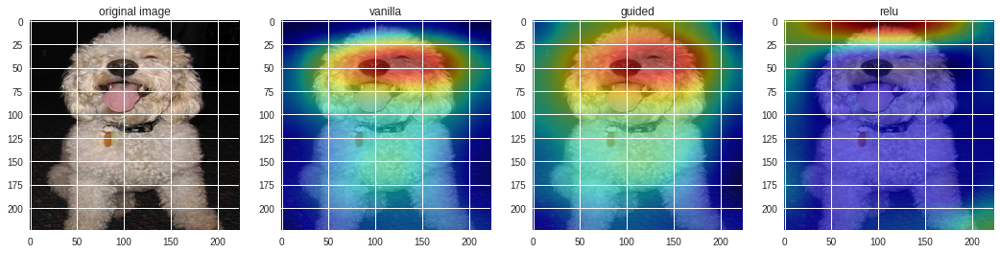

In [0]:
for i, selected_img in enumerate([cat_img, dog_img]):
  f, ax = plt.subplots(1, 4)
  ax[0].set_title('original image')
  ax[0].imshow(selected_img)
  
  for j, modifier in enumerate([None, 'guided', 'relu']):
    grads = visualize_cam(model, layer_idx, filter_indices = 0, seed_input = selected_img, penultimate_layer_idx = penultimate_layer, backprop_modifier = modifier)
    
    if modifier is None:
      modifier = 'vanilla'

    ax[j + 1].set_title(modifier)
    jet_heatmap = np.uint8(cm.jet(grads)[..., :3] * 255)
    ax[j + 1].imshow(overlay(jet_heatmap, selected_img))